Model Name =  LSTM
Training Accuracy:%85.4644
Test Accuracy:%86.9708
Training MSE:0.0003
Test MSE:0.0005
Training MAE:0.0113
Test MAE:0.0150
Training R^2:0.9950
Test R^2:0.9860


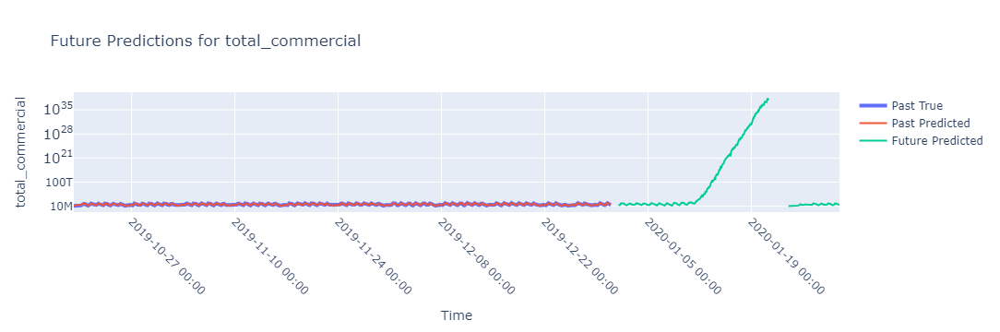

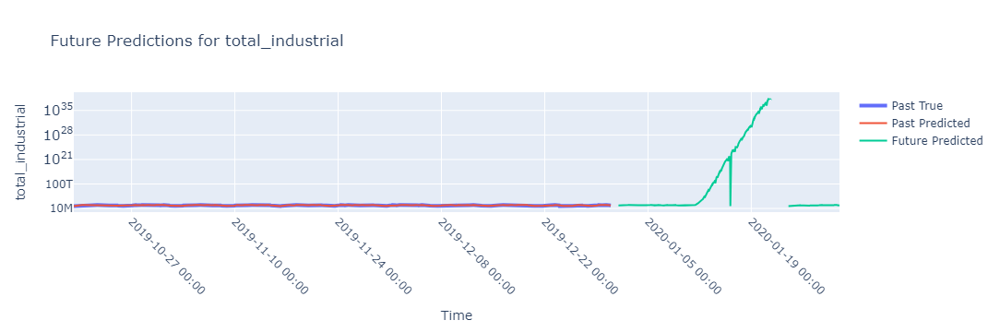

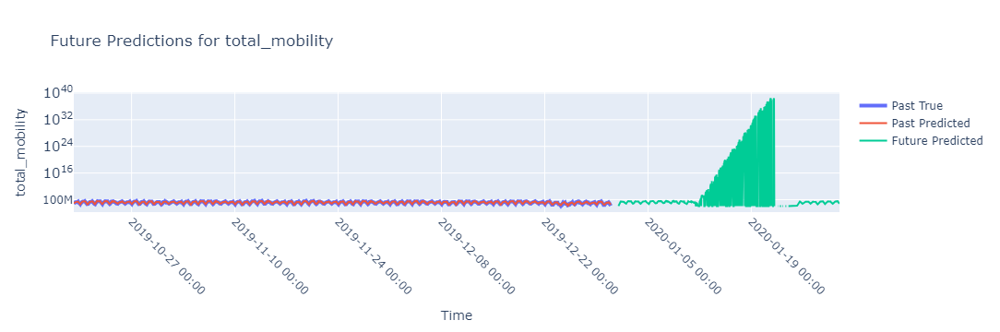

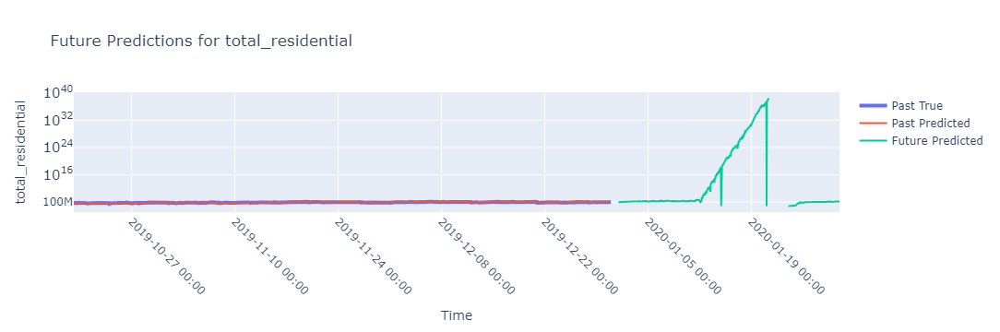

Model Name =  RNN
Training Accuracy:%68.1347
Test Accuracy:%76.2157
Training MSE:0.0008
Test MSE:0.0010
Training MAE:0.0205
Test MAE:0.0229
Training R^2:0.9867
Test R^2:0.9728


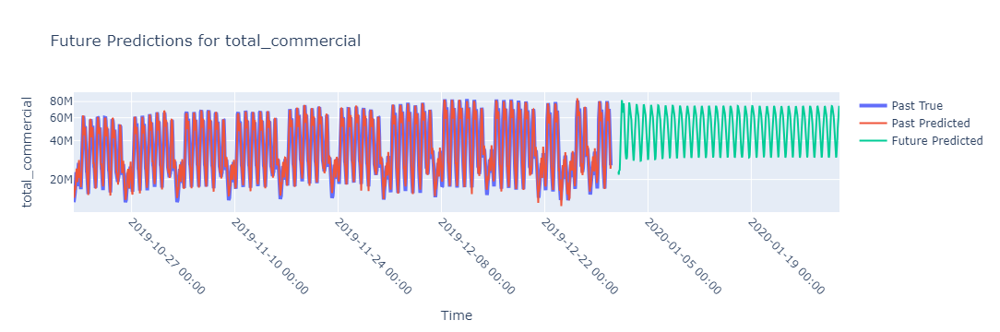

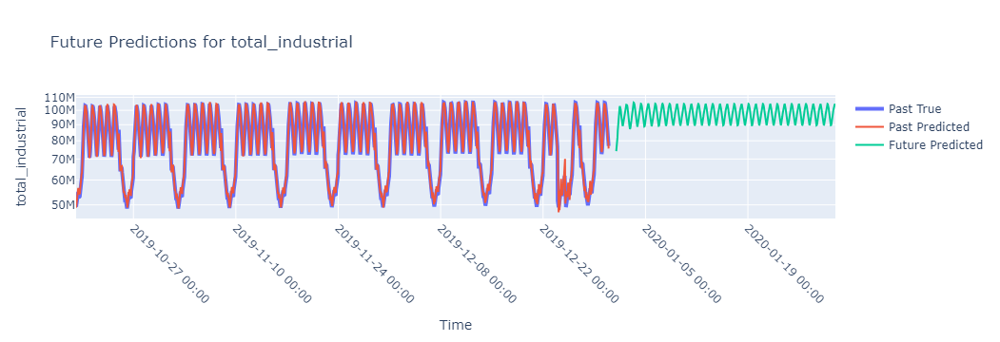

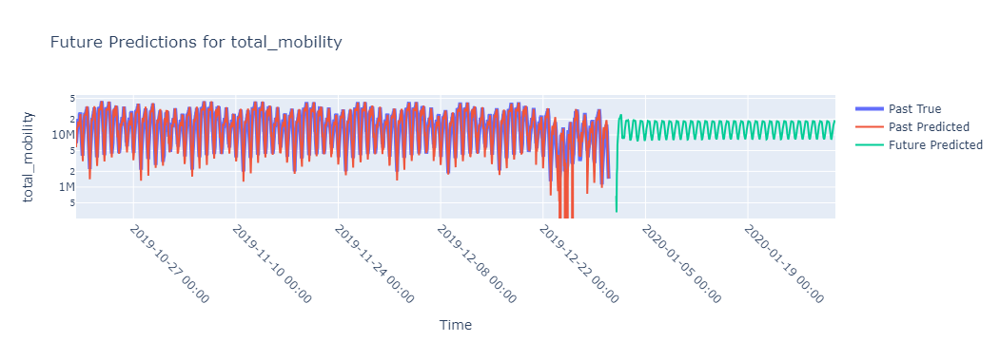

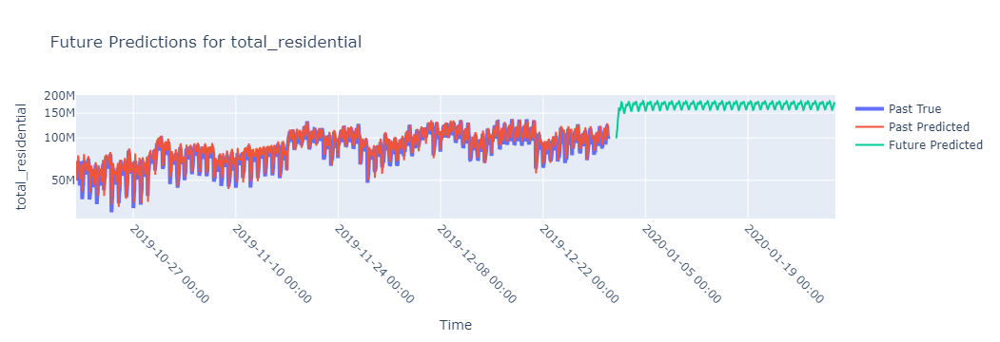

Model Name =  GRU
Training Accuracy:%71.2400
Test Accuracy:%76.0441
Training MSE:0.0008
Test MSE:0.0010
Training MAE:0.0195
Test MAE:0.0218
Training R^2:0.9858
Test R^2:0.9763


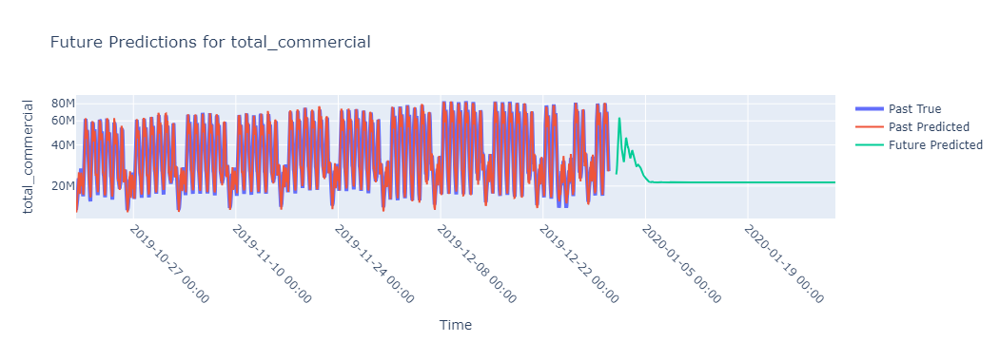

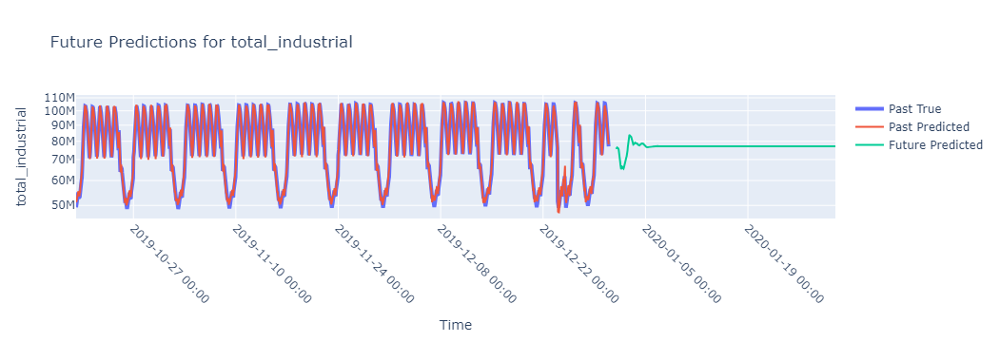

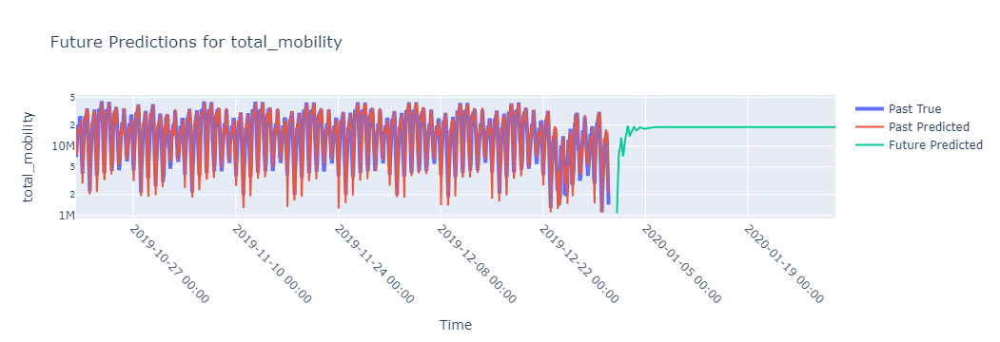

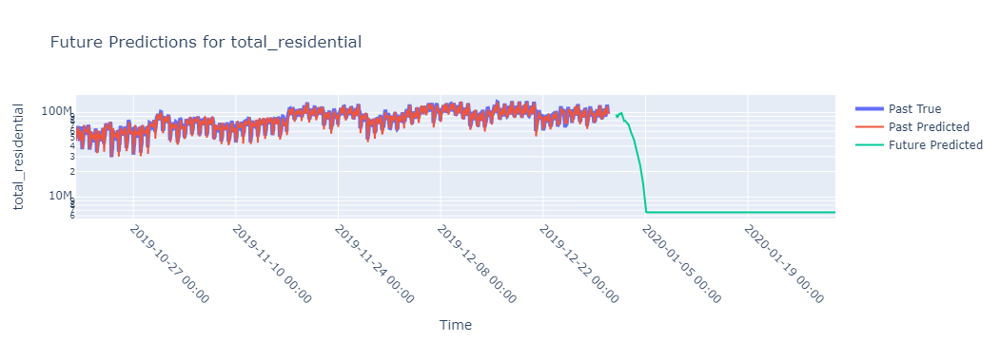

Model Name =  1DCNN
Training Accuracy:%70.9180
Test Accuracy:%72.4113
Training MSE:0.0008
Test MSE:0.0015
Training MAE:0.0195
Test MAE:0.0257
Training R^2:0.9863
Test R^2:0.9640


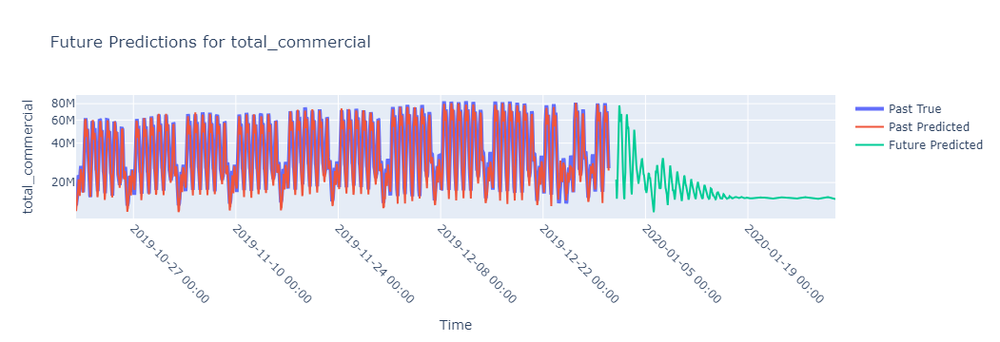

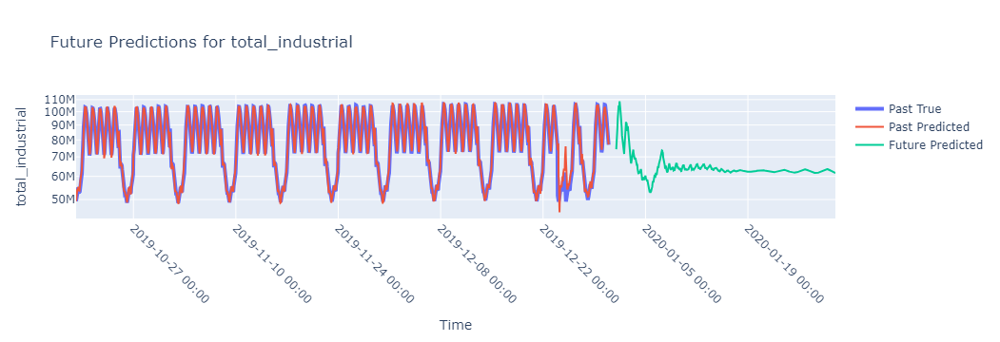

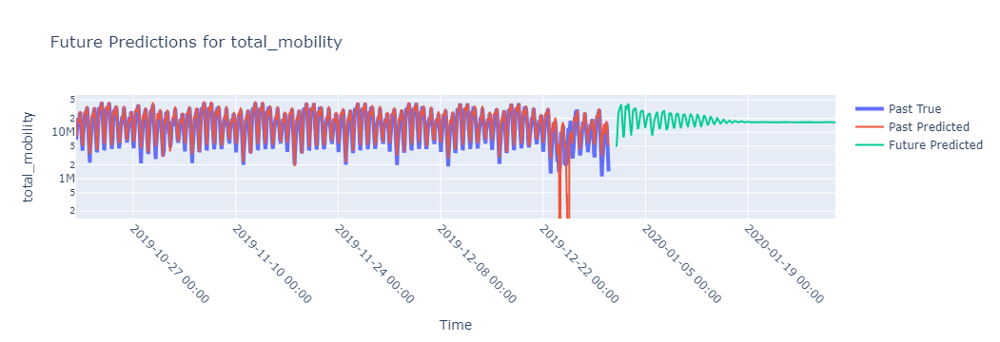

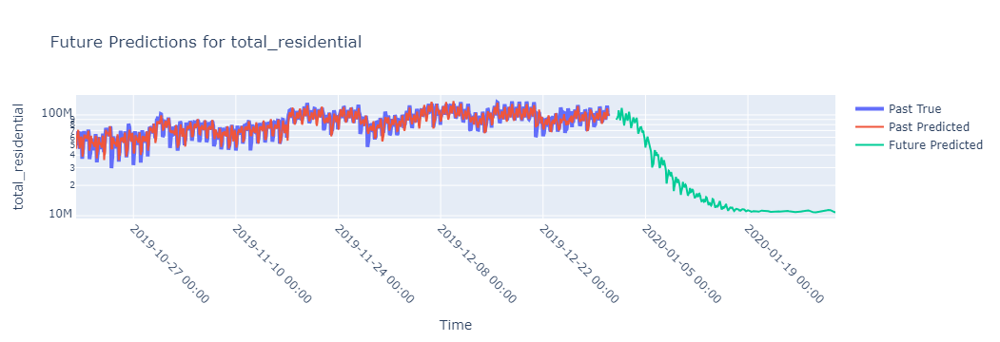

Model Name =  TCN
Training Accuracy:%70.9073
Test Accuracy:%74.2849
Training MSE:0.0010
Test MSE:0.0016
Training MAE:0.0213
Test MAE:0.0262
Training R^2:0.9835
Test R^2:0.9611


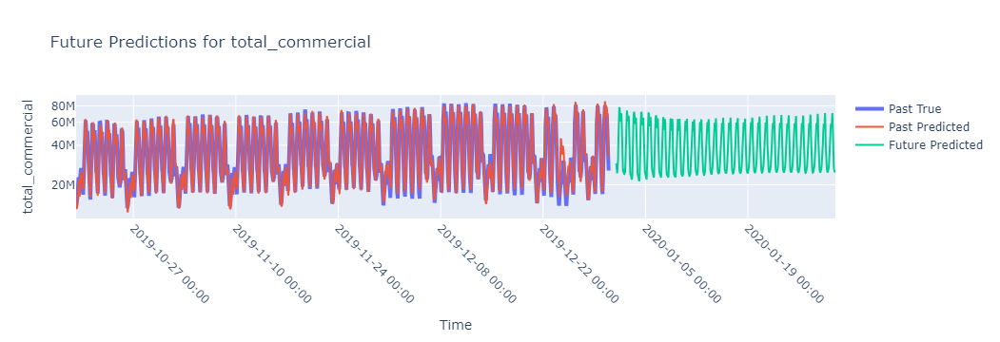

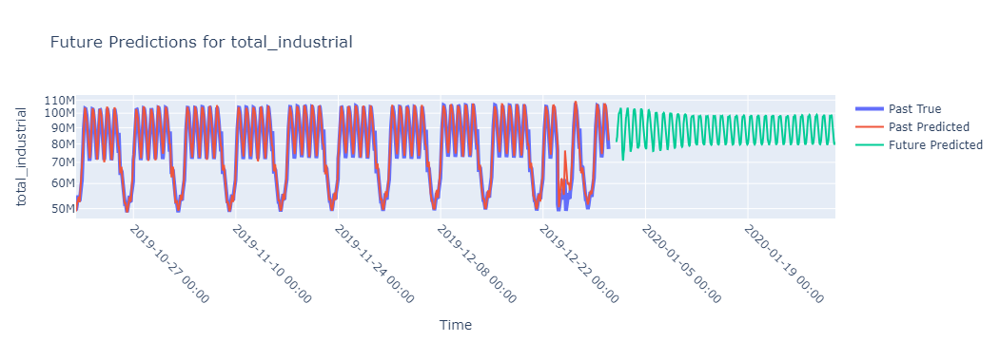

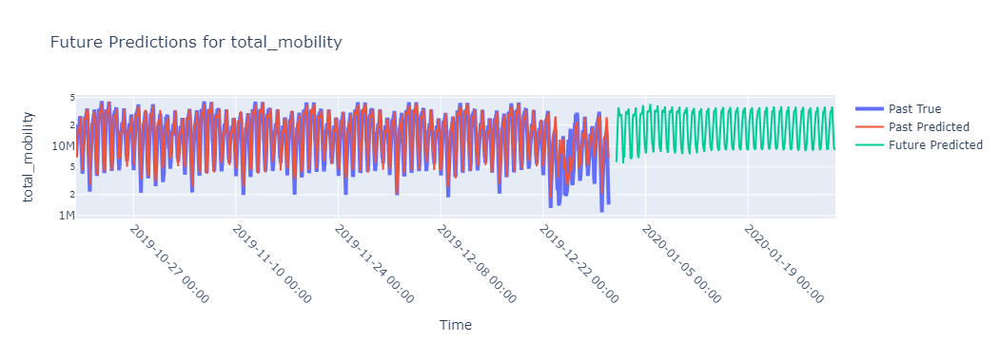

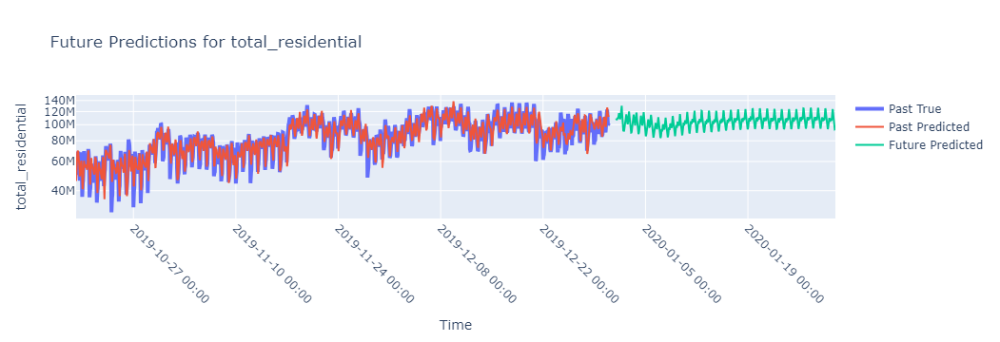

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go 
import random 
import os 
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
import tensorflow as tf
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import LSTM, SimpleRNN, GRU, Dense, Input, Dropout, Add, GlobalAveragePooling1D ,Conv1D, MaxPooling1D,Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from keras.losses import MeanSquaredError
import warnings,absl.logging

# to prevent warning messages
warnings.filterwarnings('ignore')
absl.logging.set_verbosity('error')

#pretrained label to control training process
#True-> for using pretrained models from .h5 files directly
#False-> training process
PRETRAINED = True 

#constant seed number 
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)
output_dir = 'pretrained_models_for_sectoral_prediction'
os.makedirs(output_dir,exist_ok = True)

#reading data
df = pd.read_csv('sectoral_training.csv',parse_dates = ['timestamp'],index_col = 'timestamp')

#scaling operation by using MinMaxScaler
scalers = {} 
scaled_data = pd.DataFrame(index = df.index)

for column in df.columns:
    scaler = MinMaxScaler() 
    scaled_data[column] = scaler.fit_transform(df[column].values.reshape(-1,1)).flatten()#data flattening and reshaping
    scalers[column] = scaler

scaled_data.head()


'''creates hourly sequence according to seq_length parameter.It retrieves the appropriate data and creates sequences of 
the appropriate dimensions.'''
def create_sequences(data, seq_length):
    xs,ys = [],[]
    for i in range(len(data) -seq_length):
        x = data.iloc[i:(i+seq_length)].values
        y = data.iloc[i+seq_length].values
        xs.append(x)
        ys.append(y)

    return np.array(xs),np.array(ys)

# accuracy calculation by using the specific tolerance parameter
def calculate_accuracy(true_values,predictions,tolerance =0.1):
    accuracies = []
    for i in range(true_values.shape[1]):
        accuracy = np.mean(np.abs(true_values[:,i]-predictions[:,i])/np.abs(true_values[:,i]) <= tolerance)
        accuracies.append(accuracy)
    return np.mean(accuracies)

#Forecasting based on using 24-hour data
SEQ_LENGTH = 24 
X,y = create_sequences(scaled_data,SEQ_LENGTH)#Creation of appropriate sequences



# train-test split
split_ratio = 0.8# %80 training ,%20 test 
split_idx =  int(len(X)*split_ratio)# How much of an x dimension was created based on the % value 
X_train,X_test = X[:split_idx],X[split_idx:]#To select 80% of the data allocated for training and 20% for testing"
y_train,y_test = y[:split_idx],y[split_idx:] 


#training process for each model
if not PRETRAINED:
    
    # LSTM Model
    print("Training for LSTM Model...")

    lstm_model = Sequential([
        LSTM(100,activation = 'relu', return_sequences = True, input_shape = (SEQ_LENGTH,X.shape[2])),#Taking 24-hour input(X.shape[2] = 4 different sector) 
        LSTM(100,activation = 'relu'),
        Dense(X.shape[2], activation = 'relu')# ReLU was chosen because I do not want negative predictions
        
        
    ]) 
    
    
    # Model compile
    lstm_model.compile(optimizer = 'adam',loss = 'mse')# The most common optimizer form is Adam 
    # MODEL TRAINING
    history = lstm_model.fit(X_train,y_train,epochs = 75,validation_split = 0.1, batch_size = 32 )# batch size =  To increase the batch size in each iteration
    
    #RNN Model
    print("Training for RNN Model...")
    rnn_model = Sequential()
    rnn_model.add(SimpleRNN(50, return_sequences = True,input_shape =(SEQ_LENGTH,len(df.columns))))
    rnn_model.add(SimpleRNN(50))
    rnn_model.add(Dense(len(df.columns)))
    rnn_model.compile(optimizer = 'adam',loss = 'mean_squared_error')
    #Model Training
    rnn_model.fit(X_train,y_train, epochs = 20, batch_size = 32 ,validation_data =(X_test,y_test))
        
    #GRU Model
    print("Training for GRU Model...")
    gru_model = Sequential()
    gru_model.add(GRU(50, return_sequences = True,input_shape =(SEQ_LENGTH,len(df.columns))))
    gru_model.add(GRU(50))
    gru_model.add(Dense(len(df.columns),activation = 'relu'))
    gru_model.compile(optimizer = 'adam',loss = 'mean_squared_error')
    gru_model.fit(X_train,y_train, epochs = 20, batch_size = 32 ,validation_data =(X_test,y_test))
    
    #1D CNN
    print("Training for 1D-CNN Model...")
    def build_cnn_model(input_shape):
        model = Sequential([
            Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=input_shape),
            MaxPooling1D(pool_size=2),
            Conv1D(filters=64, kernel_size=3, activation='relu'),
            MaxPooling1D(pool_size=2),
            Flatten(),
            Dense(100, activation='relu'),
            Dense(len(df.columns))
        ])
        model.compile(optimizer='adam', loss='mean_squared_error')
        return model
    
    cnn_model = build_cnn_model((SEQ_LENGTH, len(df.columns)))
    cnn_model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

   
    #TCN Model
    print("Training for TCN Model...")
    def TCN_model(input_shape):
        inputs = Input(input_shape)
    
        # First TCN block
        x = Conv1D(filters=input_shape[1], kernel_size=3, padding='causal', activation='relu')(inputs)
        x = Conv1D(filters=input_shape[1], kernel_size=3, padding='causal', activation='relu')(x)
        x = Add()([inputs, x])  # Residual connection
    
        # Second TCN block
        x = Conv1D(filters=64, kernel_size=3, padding='causal', activation='relu')(x)
        x = Conv1D(filters=64, kernel_size=3, padding='causal', activation='relu')(x)
        x = Add()([x, x])  # Residual connection
    
        # Final layers
        x = GlobalAveragePooling1D()(x)
        x = Dense(64, activation='relu')(x)
        outputs = Dense(len(df.columns))(x)
    
        model = Model(inputs, outputs)
        model.compile(optimizer='adam', loss='mean_squared_error')
        return model


    # Initialize and train the TCN model
    tcn_model = TCN_model((SEQ_LENGTH, len(df.columns)))
    tcn_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))
    
    # LOSS VİSUALIZATION(lstm)
    plt.figure(figsize = (12,6)) 
    plt.plot(history.history['loss'],label = 'Training Loss') 
    plt.plot(history.history['val_loss'],label = 'Validation Loss') 
    plt.title('Training and Validation Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
    
#condition for loading pretrained models (if PRETRAINED label is True)   
else:
    #Load LSTM model
    lstm_model = load_model(f'{output_dir}/LSTM.h5', custom_objects={'mse': MeanSquaredError()})
    # Load RNN model
    rnn_model = load_model(f'{output_dir}/RNN.h5', custom_objects={'mse': MeanSquaredError()})
    # Load GRU model
    gru_model = load_model(f'{output_dir}/GRU.h5', custom_objects={'mse': MeanSquaredError()})
    # Load TCN model
    tcn_model = load_model(f'{output_dir}/TCN.h5', custom_objects={'mse': MeanSquaredError()})
    # Load 1D-CNN model
    cnn_model = load_model(f'{output_dir}/1DCNN.h5', custom_objects={'mse': MeanSquaredError()})


# iteration for models' predictions 
for model_name, model, train_preds, test_preds in [
     ("LSTM", lstm_model, lstm_model.predict(X_train,verbose = 0), lstm_model.predict(X_test,verbose = 0)),
     ("RNN", rnn_model, rnn_model.predict(X_train,verbose = 0), rnn_model.predict(X_test,verbose = 0)),
     ("GRU", gru_model, gru_model.predict(X_train,verbose = 0), gru_model.predict(X_test,verbose = 0)),    
     ("1DCNN", cnn_model, cnn_model.predict(X_train,verbose = 0), cnn_model.predict(X_test,verbose = 0)),
     ("TCN", tcn_model, tcn_model.predict(X_train,verbose = 0), tcn_model.predict(X_test,verbose = 0))
    ]:

    print('Model Name = ', model_name) 
   

    # CHECKING MODEL PERFORMANCE
    train_predictions = model.predict(X_train,verbose = 0)
    test_predictions = model.predict(X_test,verbose = 0)

    # PERFORMANCE METRICS:
    # METRICS FOR TRAINING 
    train_accuracy = calculate_accuracy(y_train, train_predictions) 
    train_mse = mean_squared_error(y_train, train_predictions) 
    train_mae = mean_absolute_error(y_train, train_predictions) 
    train_r2 = r2_score(y_train, train_predictions)

    # METRICS FOR TEST
    test_accuracy = calculate_accuracy(y_test, test_predictions)
    test_mse = mean_squared_error(y_test, test_predictions)
    test_mae = mean_absolute_error(y_test, test_predictions)
    test_r2 = r2_score(y_test, test_predictions)

    print(f"Training Accuracy:%{train_accuracy*100:.4f}")
    print(f"Test Accuracy:%{test_accuracy*100:.4f}") 
    print(f"Training MSE:{train_mse:.4f}")
    print(f"Test MSE:{test_mse:.4f}")
    print(f"Training MAE:{train_mae:.4f}")
    print(f"Test MAE:{test_mae:.4f}")
    print(f"Training R^2:{train_r2:.4f}")
    print(f"Test R^2:{test_r2:.4f}")
    
    

    # Save the models
    if not PRETRAINED:
        model.save(f"{output_dir}/{model_name}.h5")
   
    # Future Prediction
    future_steps = 30*24 # for one month
    future_data = scaled_data[-SEQ_LENGTH:].values.reshape(1,SEQ_LENGTH,-1)

    future_predictions = []
    for _ in range(future_steps):
        pred = model.predict(future_data,verbose = 0)#prediction for future timestamps
        future_predictions.append(pred.flatten())
        future_data = np.append(future_data[:,1:,:],pred.reshape(1,1,-1),axis = 1)
                                
    future_predictions = np.array(future_predictions)
    
     
    # Generating Future Dates
    last_date = df.index[-1]
    future_dates = pd.date_range(start = last_date, periods = future_steps + 1, freq = 'H')[1:]
    # Data Rescaling 
    future_predictions_rescaled = np.zeros_like(future_predictions) 
    for i, column in enumerate(df.columns):
        future_predictions_rescaled[:,i] = scalers[column].inverse_transform(future_predictions[:,i].reshape(-1,1)).flatten() 
    
    
    
    
    #Visualization 
    for i, column in enumerate(df.columns):
        fig = go.Figure() 
        
        fig.add_trace(go.Scatter(
            x=df.index[split_idx:],
            y=scalers[column].inverse_transform(y_test[:, i].reshape(-1, 1)).flatten(), 
            mode='lines', name='Past True', line=dict(width=4)  
        ))
        
        fig.add_trace(go.Scatter(
            x=df.index[split_idx:],
            y=scalers[column].inverse_transform(test_predictions[:, i].reshape(-1, 1)).flatten(),  
            mode='lines', name='Past Predicted'
        ))
        
        # future predictions
        fig.add_trace(go.Scatter(
            x=future_dates,
            y=future_predictions_rescaled[:, i],
            mode='lines', name='Future Predicted'
        ))
        

        fig.update_layout(
            title=f'Future Predictions for {column}',
            xaxis_title='Time',
            yaxis_title=column,
            xaxis=dict(
                tickformat='%Y-%m-%d %H:%M',
                tickangle=45
            ),
            yaxis_type="log" 
        )
        
        fig.show()
